In [ ]:
# this is the second half of exercise 6, which was split off for 2025 since wavelets were not covered before the exercise session

In [24]:
# Let's clear up the workspace.
%reset -sf

# We have to re-load the needed libraries
import numpy as np               # Array manipulation
import matplotlib.pyplot as plt  # Plotting
import pywt                      # Wavelets
plt.rcParams['font.size'] = 15   # This set the fontsize of the figure 
plt.rcParams['figure.facecolor'] = 'white'

## 2. Wavelet transforms

In this section we want to illustrate some uses of the discrete wavelet transforms for remote sensing data in particular satellite images.

The wavelet decomposition provides a way for analyzing signals both in frequency and time (or space for images), which unlike the Fourier transform makes them useful for analyzing both local and global features of a signal.

Wavelet transforms can be stored more efficiently than Fourier transform, which opened new possibilities for signal compression.

In this exercise we will focus on the discrete wavelet transform (DWT) used for multiresolution analysis (Mallat 1989, https://doi.org/10.1109/34.192463).
The algorithm performing this transform employs two sets of functions, called *scaling functions* and *wavelet functions*, which are associated to lowpass and highpass filters, respectively.

The decomposition of the signal is obtained by successive highpass- and lowpass- filtering of the original signal.
The low-pass coefficients are called *approximation coefficients* and the high-pass coefficients are called *details coefficients*.

The first subsection illustrates this decomposition on a 1-D example; see the course slides for more explanations.


### 2.1 Wavelet multiresolution analysis in 1D

We will visualize an example in the next code cell with a two-level transform of a 1D signal. No input from you is required.

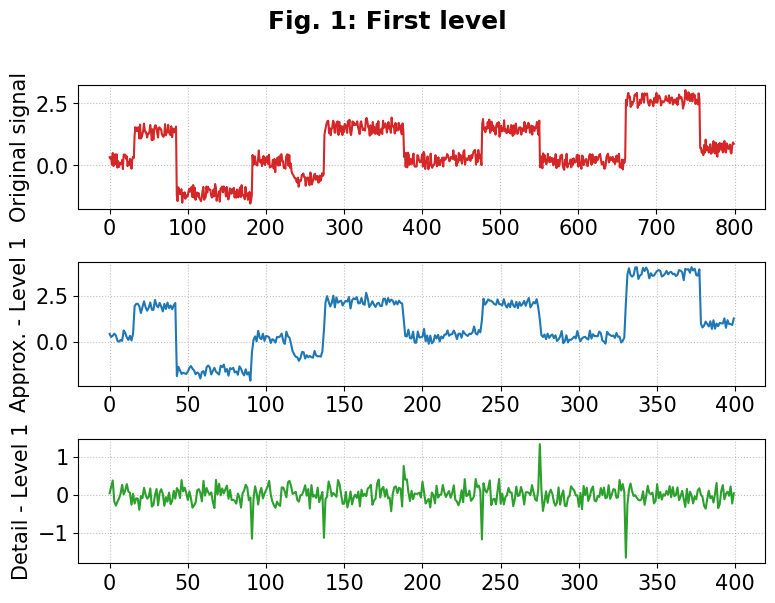

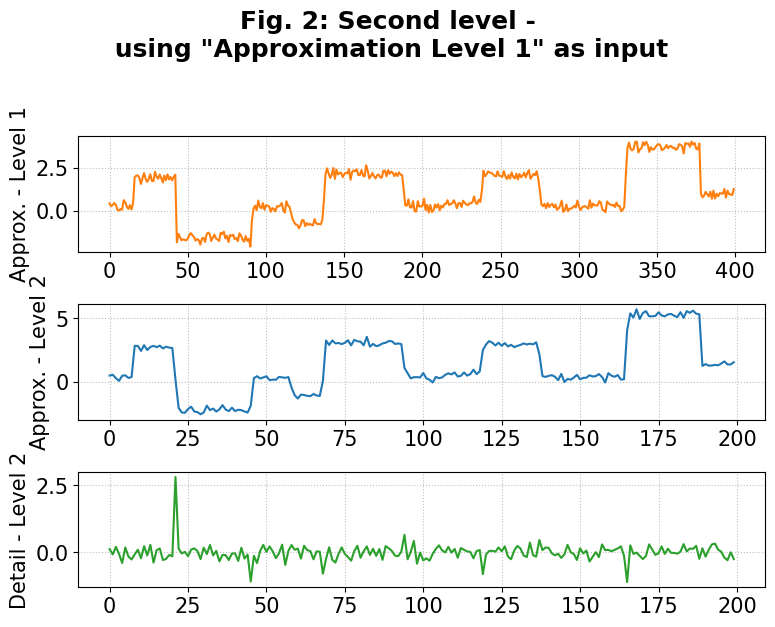

In [25]:
# Loading the signal
signal = np.load("Data/2_Wavelets/signal.npy")

# First level
approximation1, detail1 = pywt.dwt(signal, 'db1')

# Second level
approximation2, detail2 = pywt.dwt(approximation1, 'db1')

"""
Note that pywt provides "pre-built" multi-level decompositions 
which enable to avoid performing the above steps separately 

Example: 
     approximation_2, detail_2 = pywt.wavedec(signal, 'db1', level=2)

"""

# Visualize first level
fig, axes = plt.subplots(3,1, figsize=(8, 6))

ax0 = axes[0]
ax0.plot(signal, c='tab:red')
ax0.set_ylabel('Original signal')

ax1 = axes[1]
ax1.plot(approximation1, c='tab:blue')
ax1.set_ylabel('Approx. - Level 1')

ax2 = axes[2]
ax2.plot(detail1, c='tab:green')
ax2.set_ylabel('Detail - Level 1')

for ax in axes:
    ax.set_axisbelow(True)
    ax.grid(ls=':', color='gray', alpha=0.5)
plt.suptitle('Fig. 1: First level', weight='bold',y=1.01)
plt.tight_layout()

# Visualize second level
fig, axes = plt.subplots(3,1, figsize=(8, 6))

ax0 = axes[0]
ax0.plot(approximation1, c='tab:orange')
ax0.set_ylabel('Approx. - Level 1')

ax1 = axes[1]
ax1.plot(approximation2, c='tab:blue')
ax1.set_ylabel('Approx. - Level 2')

ax2 = axes[2]
ax2.plot(detail2, c='tab:green')
ax2.set_ylabel('Detail - Level 2')

for ax in axes:
    ax.set_axisbelow(True)
    ax.grid(ls=':', color='gray', alpha=0.5)
plt.suptitle('Fig. 2: Second level -\n using "Approximation Level 1" as input', weight='bold',y=1.05)
plt.tight_layout()

plt.show()

In the example displayed above the red signal is the original signal.
The two-step procedure followed is:
- This signal is low-pass filtered with the filter corresponding to the scaling function to give the *approximation coefficients* at level 1 (blue curve), and high-pass filtered with the filter corresponding to the wavelet function to give the *details coefficients* at level 1 (green curve).

**The approximation coefficients represents the low-frequency components and the details coefficients the high frequency components**.

- The next level of the wavelet transform is computed using not the original signal but the approximation coefficients of the previous level (level one, in orange, i.e. equal to the blue curve in the first figure). This gives a new set of *approximation coefficients* (blue curve) and *detail coefficients* (green curve) shown in the bottom three panels.

You can notice that the green curve in the top panel is more noisy than the green curve on the bottom panel.
The reason is that the details at level 2 were obtained by high-pass filtering the approximation signal at level 1, which has already fewer high-frequency components than the original signal.
This procedure can be repeated recursively over and over to increase the level of the DWT transform.
Note that after each step, the size of the approximation and detail coefficients half that of the input signal: this "multiresolution" decomposition thus provides an analysis of the signal across scales.

Generally the approximation coefficients at intermediate levels are not stored, which means that for a DWT transform of level N, the final output will be N signals of *detail coefficients* (at levels 1 to N) and the  signal of *approximation coefficients* at only the level N. 
This is sufficient for the reconstruction of the original signal. 
The wavelet transform is an invertible process and the original signal or image can be retrieved by applying the inverse wavelet transform, which is simply a mirrored version of the filters, to the approximation and details coefficients.

Note that there is a linear relation between frequency and wavelet level (the frequency decreases with the level).
The *detail coefficients* of the first level correspond to the highest frequencies of the signal.

When applying DWT to 2D images, the procedure is similar except that the high-pass filtering is applied in three directions: horizontally, vertically and diagonally.
This means that for a transform of level 1, instead of just one signal of *details coefficient* and one signal of *approximation coefficients* as in the 1D case, you will get three images of *details coefficients* (hor., ver. and diag. directions) and one image of *approximation coefficient*.



### 2.2 Wavelet multiresolution analysis in 2D

We will now look at a practical example of multiresolution analysis for satellite imagery, using an aerial grayscale image of EPFL campus (source: Google maps). \
Run the following cells to load the grayscale image.


In [26]:
# Let's clear up the workspace.
%reset -sf

# We have to re-load the needed libraries
import numpy as np               # Array manipulation
import PIL.Image                 # Manipulation of images
import matplotlib.pyplot as plt  # Plotting
import pywt                      # Wavelets

# For the 2D wavelet transform we will directly load the needed functions
from pywt._doc_utils import wavedec2_keys, draw_2d_wp_basis
plt.rcParams['font.size'] = 15   # This set the fontsize of the figure 
plt.rcParams['figure.facecolor'] = 'white'

Image size in pixel:  (800, 800)


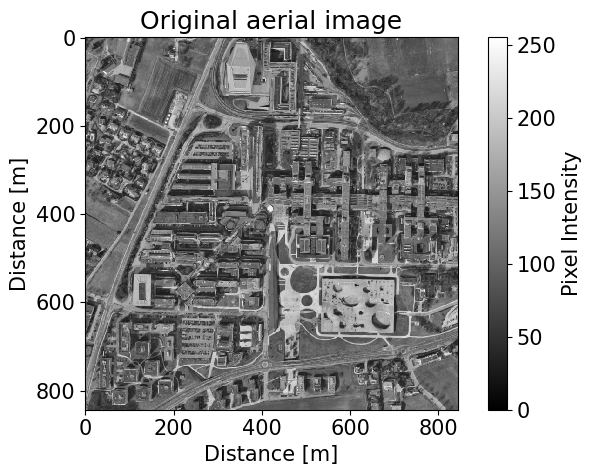

In [27]:
# Loading the of the aerial image
img = np.array(PIL.Image.open("Data/2_Wavelets/epfl_campus_grayscale.png"))

# Print the size of the image
print('Image size in pixel: ', img.shape)

pix_res = 844/800 # determined from Swissmap (map.geo.admin.ch)

# Computing x and y coordinates in pixels
dim_x = img.shape[1]
dim_y = img.shape[0]
new_x = np.arange(0, dim_x)*pix_res
new_y = np.arange(0, dim_y)*pix_res

# Displaying the image
fig, ax = plt.subplots(1,1,figsize=(7,5))
ax.set_aspect('equal')
mappable = ax.pcolormesh(new_x,new_y,img, cmap='gray', vmin=0, vmax=255, shading='auto')
ax.invert_yaxis()
plt.sca(ax)
plt.colorbar(mappable=mappable, label='Pixel Intensity')
ax.set_xlabel('Distance [m]')
ax.set_ylabel('Distance [m]')
ax.set_title('Original aerial image')
plt.tight_layout()
fig.savefig('Figures/epfl_campus_original.png',dpi=300,bbox_inches='tight')


Run the following cell to perform the 2D decomposition. 
The wavelet used is "Daubechies type 1" (`'db1'`) but other types could be used.
We will **not** investigate here the influence of the type of chosen wavelets on the results.

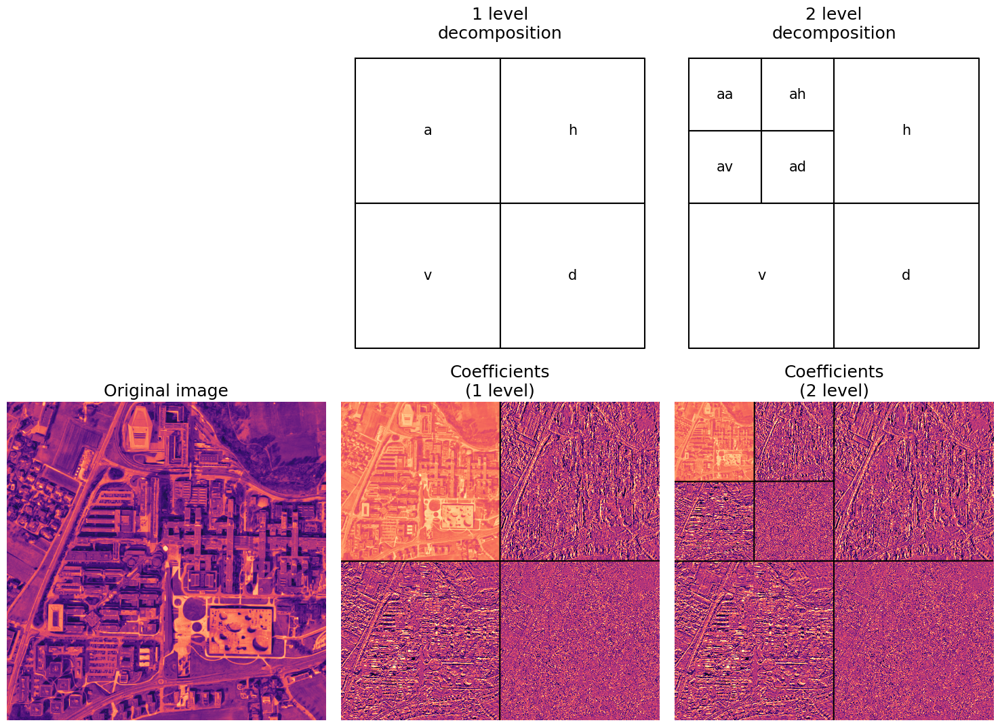

In [28]:
# Define the number of decomposition levels to draw
max_lev = 2

# Define how many levels to explicitly label on the plots
label_levels = max_lev

# Choose a colormap (to see details better even though the image is still in "black and white")
cmap = plt.get_cmap("magma")

# Retrieve the shape of the image 
shape = img.shape 

# Create the Figure 
fig, axes = plt.subplots(2, max_lev+1, figsize=[15, 11])
for level in range(0, max_lev + 1):
    # Show the original image before decomposition if level == 0
    if level == 0:
        axes[0, 0].set_axis_off()
        axes[1, 0].imshow(img, cmap=cmap, vmin=0, vmax=255)
        axes[1, 0].set_title('Original image')
        axes[1, 0].set_axis_off()
        continue

    # Plot sub-band boundaries of a standard DWT basis
    draw_2d_wp_basis(shape, wavedec2_keys(level),
                     ax=axes[0, level],
                     label_levels=label_levels)
    # Set title 
    axes[0, level].set_title('{} level\ndecomposition'.format(level))

    # Compute the 2D DWT
    c = pywt.wavedec2(img, 'db1', mode='periodization', level=level)
    
    # Normalize/increase each coefficient array independently for better visibility
    c[0] /= np.abs(c[0]).max()
    for detail_level in range(level):
        enhanced_d_list = []
        for d in c[detail_level + 1]:
            nomr_d = d/np.abs(d).max()
            increased_d = 20. * nomr_d
            increased_d[increased_d > 1] = 1
            increased_d[increased_d < -1] = -1
            enhanced_d_list.append(increased_d)
        c[detail_level + 1] = enhanced_d_list
        
    # Show the normalized coefficients
    arr, slices = pywt.coeffs_to_array(c)
    axes[1, level].imshow(arr, cmap=cmap)
    for l in range(1,level+1):
        axes[1,level].plot([len(arr)/(2**l),len(arr)/(2**l)-1],[1, len(arr)/(2**(l-1))-1],'k')
        axes[1,level].plot([1, len(arr)/(2**(l-1))-1],[len(arr)/(2**l),len(arr)/(2**l)-1],'k')    
    # Set coefficients title 
    axes[1, level].set_title('Coefficients\n({} level)'.format(level))
    axes[1, level].set_axis_off()
    
for ax in axes.flatten():
    ax.set_aspect('equal')
plt.tight_layout()
plt.show()

fig.savefig('Figures/wavelet_decomposition',dpi=300,bbox_inches='tight')

In the plots produced by the previous cell, the top row indicates the coefficient names: **v** correspond to vertical details, **h** to horizontal details and **d** to diagonal details.
Note that for subsequent levels of decomposition (level 2 onwards), only the approximation coefficients (the lowpass subband) are further decomposed, from there the **a** label in the top-left quadrant.

Take a look at the different decompositions and answer the following question:

> **Question 14**: When looking carefully, we can notice that different details of the original image correspond to different features in the coefficient panels. Provide at least one feature of the original image whose signal is clearly visible in the *horizontal* component, but almost absent in the vertical one.
Identify also a second feature in the original image whose signal is clearly visible in the *vertical* component, but less marked in the horizontal one. 

Let's clear up the workspace after this subsection. Run the next cell to remove all variables, and re-load the needed libraries.

### 2.3 Wavelet denoising

Denoising is an import application of wavelets, particularly relevant to imaging and remote sensing applications.

The goal of image denoising is to remove noise as much as possible while preserving the features of the image.
The multi-resolution analysis performed by the wavelet transform is a very powerful technique to reach this goal.
In the wavelet domain, most image information is contained in 1) the approximation coefficients and 2) the largest wavelet detail coefficients, while the noise typically corresponds to detail coefficients with small absolute values.

As in wavelet compression, the usual approach to wavelet denoising consists of thresholding the wavelet (detail) coefficients. The thresholds are generally chosen using different estimators that rely on the estimation of the noise variance.

Two approaches exist:
- **Hard thresholding**, which can be described as the usual process of setting to zero the elements whose absolute values are lower than the threshold.
- **Soft thresholding**, which is an extension of hard thresholding, first setting to zero the elements whose absolute values are lower than the threshold, and then shrinking the nonzero coefficients towards 0.

The following cells produce a figure illustrating hard and soft thresholding. (No input required)


In [29]:
# Let's clear up the workspace.
%reset -sf

# We have to re-load the needed libraries
import numpy as np               # Array manipulation
import PIL.Image                 # Manipulation of images
import matplotlib.pyplot as plt  # Plotting
import skimage
import skimage.restoration       # Wavelets denoising
from matplotlib.patches import Circle  # For drawing circles on the plots
import pywt
plt.rcParams['font.size'] = 15   # This set the fontsize of the figure 
plt.rcParams['figure.facecolor']='white'

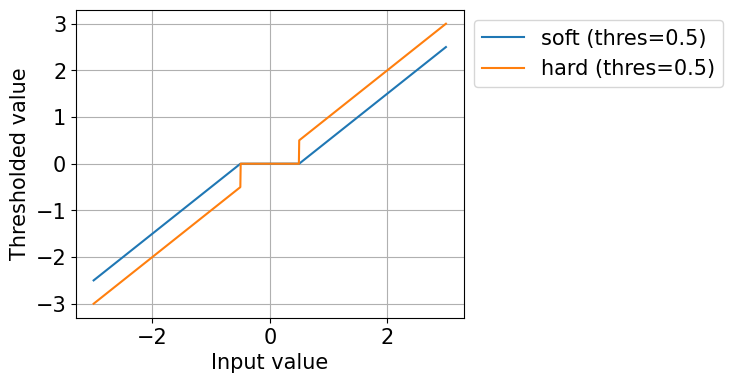

In [30]:
# The following lines of code are inspired from https://pywavelets.readthedocs.io/en/latest/ref/thresholding-functions.html
s = np.linspace(-3, 3, 1000)
s_soft = pywt.threshold(s, value=0.5, mode='soft')
s_hard = pywt.threshold(s, value=0.5, mode='hard')
s_firm1 = pywt.threshold_firm(s, value_low=0.5, value_high=1)
s_firm2 = pywt.threshold_firm(s, value_low=0.5, value_high=2)
s_firm3 = pywt.threshold_firm(s, value_low=0.5, value_high=4)

fig, ax = plt.subplots(figsize=(5, 4))
ax.plot(s, s_soft)
ax.plot(s, s_hard)
ax.legend(['soft (thres=0.5)', 'hard (thres=0.5)'],loc='upper left',bbox_to_anchor=(1,1))
ax.set_xlabel('Input value')
ax.set_ylabel('Thresholded value')
ax.grid()

In this exercise we will study the performance of wavelet denoising on three types of noise.

- **Gaussian white noise**: Gaussian white noise is noise generated by a gaussian distribution with zero mean and a given variance (which can be related to the intensity of the noise).
- **Speckle noise**: Speckle noise is an additive noise, i.e. its intensity is proportional on the intensity of the signal. It is inherently associated with active radar. Speckle is a granular ’noise’ caused by interference of reflected electromagnetic waves by a rough surface that inherently exists and degrades the quality of synthetic aperture radar (SAR) and medical ultrasound images.
- **Salt and pepper noise**: Salt and pepper noise is a form of noise caused by malfunctioning pixels in camera sensors, faulty memory locations in hardware or noisy transmissions. In the corrupted image, noisy pixels can take only the maximum or the minimum value (resp. black or white).

Let's generate artificially some noise to apply to the aerial image that we analyzed in the previous section.

Image size in pixel:  (800, 800)


/tmp/ipykernel_157/1555020781.py:24: FutureWarning: `seed` is a deprecated argument name for `random_noise`. It will be removed in version 0.23. Please use `rng` instead.
  img_noisy_dict['gaussian'] = skimage.util.random_noise(img, mode='gaussian', seed=1234, var=gaussian_var)
/tmp/ipykernel_157/1555020781.py:28: FutureWarning: `seed` is a deprecated argument name for `random_noise`. It will be removed in version 0.23. Please use `rng` instead.
  img_noisy_dict['speckle'] = skimage.util.random_noise(img, mode='speckle', seed=1234, var=speckle_var)
/tmp/ipykernel_157/1555020781.py:32: FutureWarning: `seed` is a deprecated argument name for `random_noise`. It will be removed in version 0.23. Please use `rng` instead.
  img_noisy_dict['salt_pepper'] = skimage.util.random_noise(img, mode='s&p', seed=1234, amount=sp_density)


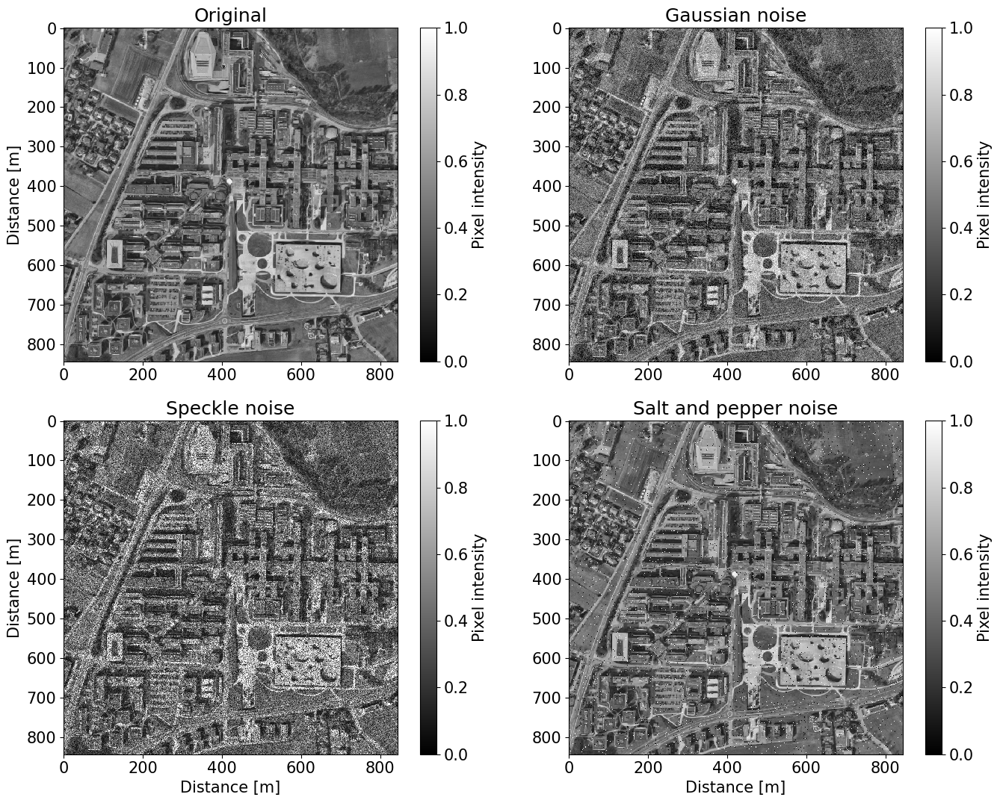

In [31]:
# Load the aerial image
img = np.array(PIL.Image.open("Data/2_Wavelets/epfl_campus_grayscale.png"))[:800,:800] 

# Scale image between 0 and 1 
img = img/255 

# Print the size of the image
print('Image size in pixel: ', img.shape)

# Resolution of a pixel
pix_res = 844/800 # determined from Swissmap (map.geo.admin.ch)

# Define x and y axis in [m]
dim_x = img.shape[1]
dim_y = img.shape[0]
new_x = np.arange(0, dim_x) * pix_res
new_y = np.arange(0, dim_y) * pix_res

# Build a dictionary containing the simulated noisy images
img_noisy_dict = {}

# Gaussian noise
gaussian_var = 0.01 # Variance of noise
img_noisy_dict['gaussian'] = skimage.util.random_noise(img, mode='gaussian', rng=1234, var=gaussian_var)

# Speckle noise
speckle_var = 0.15  # Variance of noise
img_noisy_dict['speckle'] = skimage.util.random_noise(img, mode='speckle', rng=1234, var=speckle_var)

# Salt & Pepper noise
sp_density = 0.02 # Proportion of image pixels to replace with noise 
img_noisy_dict['salt_pepper'] = skimage.util.random_noise(img, mode='s&p', rng=1234, amount=sp_density)

# Visualizing all images
fig, axes = plt.subplots(2, 2, figsize=(14,11))

for ax in axes.flatten():
    ax.set_aspect('equal')

ax0 = axes[0, 0]
mappable = ax0.pcolormesh(new_x, new_y, img, 
                          cmap='gray', shading='auto', vmin=0., vmax=1.)
plt.sca(ax0)
plt.colorbar(mappable=mappable, label='Pixel intensity')
ax0.invert_yaxis()
ax0.set_title('Original')
ax0.set_ylabel('Distance [m]')

ax1 = axes[0, 1]
mappable = ax1.pcolormesh(new_x, new_y, img_noisy_dict['gaussian'], 
                          cmap='gray', shading='auto', vmin=0., vmax=1.)
plt.sca(ax1)
plt.colorbar(mappable=mappable, label='Pixel intensity')
ax1.invert_yaxis()
ax1.set_title('Gaussian noise')

ax2 = axes[1, 0]
mappable = ax2.pcolormesh(new_x, new_y, img_noisy_dict['speckle'], 
                          cmap='gray', shading='auto', vmin=0., vmax=1.)
plt.sca(ax2)
plt.colorbar(mappable=mappable, label='Pixel intensity')
ax2.invert_yaxis()
ax2.set_title('Speckle noise')
ax2.set_xlabel('Distance [m]')
ax2.set_ylabel('Distance [m]')

ax3 = axes[1, 1]
mappable = ax3.pcolormesh(new_x, new_y, img_noisy_dict['salt_pepper'],
                          cmap='gray', shading='auto', vmin=0., vmax=1.)
plt.sca(ax3)
plt.colorbar(mappable=mappable, label='Pixel intensity')
ax3.invert_yaxis()
ax3.set_title('Salt and pepper noise')
ax3.set_xlabel('Distance [m]')

plt.tight_layout()
plt.show()
fig.savefig('Figures/epfl_campus_w_noise.png',dpi=300,bbox_inches='tight')


The following code cell performs the de-noising. \
The procedure starts by estimating the standard deviation of the noise. This is used by the algorithm to determine the threshold value to be used.\
Once the estimate is ready, the hard and soft thresholding are applied.

In [32]:
denoised_soft_img = {}
denoised_hard_img = {}
for noise_type in ['gaussian', 'salt_pepper','speckle']:
    # Estimating the standard deviation "sigma" of the noise
    sigma_est = skimage.restoration.estimate_sigma(img_noisy_dict[noise_type], channel_axis=False)

    # Soft thresholding
    denoised_soft_img[noise_type] = skimage.restoration.denoise_wavelet(img_noisy_dict[noise_type],
                                                                     sigma=sigma_est,
                                                                     wavelet='db1',
                                                                     mode='soft',
                                                                     channel_axis=False,
                                                                     rescale_sigma=True)
    # Hard thresholding
    denoised_hard_img[noise_type] = skimage.restoration.denoise_wavelet(img_noisy_dict[noise_type],
                                                                     sigma=sigma_est,
                                                                     wavelet='db1',
                                                                     mode='hard',
                                                                     channel_axis=False,
                                                                     rescale_sigma=True)
    
    

To visualize the results for each type of noise, **set the value of `NOISE_TYPE` and run the cell**. \
Two figures are created: the first one with the views of the entire campus, and the second one with a zoom on the Rolex center, in order to visualize smaller-scale structures.

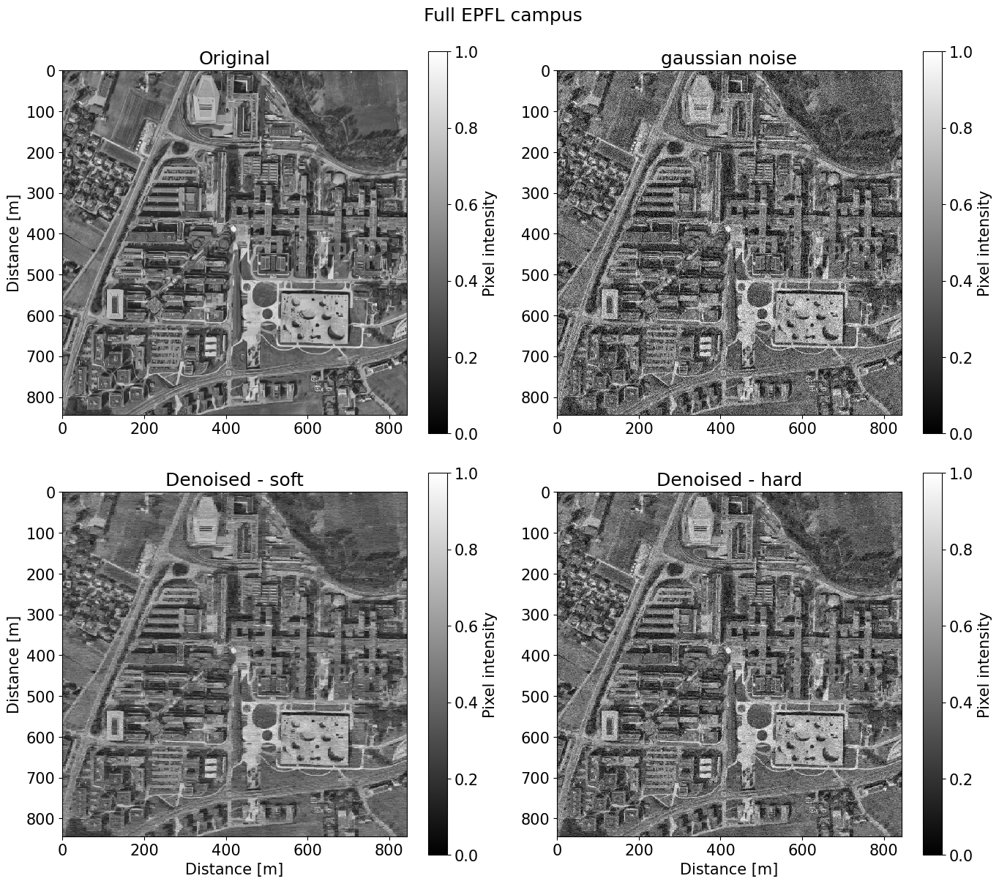

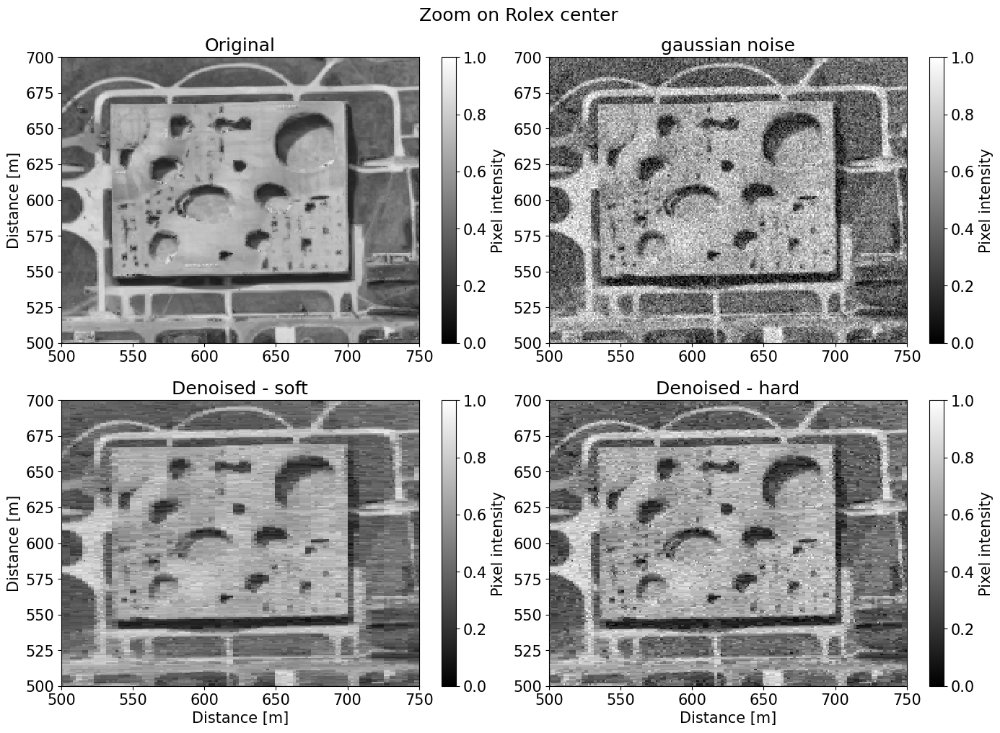

In [33]:
# ------------------------------------------------------------------------
# Change the following variable, defining the type of noise (this will select the noisy image defined before)

NOISE_TYPE = 'gaussian' # should be either 'gaussian', 'salt_pepper' or 'speckle'

# ------------------------------------------------------------------------

# Visualizing results
fig, axes = plt.subplots(2, 2, figsize=(14,12))

for ax in axes.flatten():
    ax.set_aspect('equal')

ax0 = axes[0, 0]
mappable = ax0.pcolormesh(new_x, new_y, img, 
                          cmap='gray', shading='auto', vmin=0., vmax=1.)
plt.sca(ax0)
plt.colorbar(mappable=mappable, label='Pixel intensity')
ax0.invert_yaxis()
ax0.set_title('Original')
ax0.set_ylabel('Distance [m]')

ax1 = axes[0, 1]
mappable = ax1.pcolormesh(new_x, new_y, img_noisy_dict[NOISE_TYPE], 
                          cmap='gray', shading='auto', vmin=0., vmax=1.)
plt.sca(ax1)
plt.colorbar(mappable=mappable, label='Pixel intensity')
ax1.invert_yaxis()
ax1.set_title('%s noise'%NOISE_TYPE)

ax2 = axes[1, 0]
mappable = ax2.pcolormesh(new_x, new_y, denoised_soft_img[NOISE_TYPE], 
                          cmap='gray', shading='auto', vmin=0., vmax=1.)
plt.sca(ax2)
plt.colorbar(mappable=mappable, label='Pixel intensity')
ax2.invert_yaxis()
ax2.set_title('Denoised - soft')
ax2.set_xlabel('Distance [m]')
ax2.set_ylabel('Distance [m]')

ax3 = axes[1, 1]
mappable = ax3.pcolormesh(new_x, new_y, denoised_hard_img[NOISE_TYPE], 
                          cmap='gray', shading='auto', vmin=0., vmax=1.)
plt.sca(ax3)
plt.colorbar(mappable=mappable, label='Pixel intensity')
ax3.invert_yaxis()
ax3.set_title('Denoised - hard')
ax3.set_xlabel('Distance [m]')

plt.tight_layout()
plt.suptitle('Full EPFL campus', y = 1.02)
plt.show()

fig.savefig(f'Figures/wavelet_denoising_full_image_{NOISE_TYPE}', dpi=300, bbox_inches='tight')

#######################################################################################################
### Zoom on the EPFL Rolex Center

fig, axes = plt.subplots(2, 2, figsize=(14,10))

for ax in axes.flatten():
    ax.set_aspect('equal')

ax0 = axes[0, 0]
mappable = ax0.pcolormesh(new_x, new_y, img, 
                          cmap='gray', shading='auto', vmin=0., vmax=1.)
plt.sca(ax0)
plt.colorbar(mappable=mappable, label='Pixel intensity')
ax0.invert_yaxis()
ax0.set_title('Original')
ax0.set_ylabel('Distance [m]')

ax1 = axes[0, 1]
mappable = ax1.pcolormesh(new_x, new_y, img_noisy_dict[NOISE_TYPE],
                          cmap='gray', shading='auto', vmin=0., vmax=1.)
plt.sca(ax1)
plt.colorbar(mappable=mappable, label='Pixel intensity')
ax1.invert_yaxis()
ax1.set_title('%s noise'%NOISE_TYPE)

ax2 = axes[1, 0]
mappable = ax2.pcolormesh(new_x, new_y, denoised_soft_img[NOISE_TYPE], 
                          cmap='gray', shading='auto', vmin=0., vmax=1.)
plt.sca(ax2)
plt.colorbar(mappable=mappable, label='Pixel intensity')
ax2.invert_yaxis()
ax2.set_title('Denoised - soft')
ax2.set_xlabel('Distance [m]')
ax2.set_ylabel('Distance [m]')

ax3 = axes[1, 1]
mappable = ax3.pcolormesh(new_x, new_y, denoised_hard_img[NOISE_TYPE], 
                          cmap='gray', shading='auto', vmin=0., vmax=1.)
plt.sca(ax3)
plt.colorbar(mappable=mappable, label='Pixel intensity')
ax3.invert_yaxis()
ax3.set_title('Denoised - hard')
ax3.set_xlabel('Distance [m]')

plt.tight_layout()

for ax in axes.flatten():
    ax.set_xlim(500,750)
    ax.set_ylim(500,700)
    
plt.suptitle('Zoom on Rolex center',y=1.02)

fig.savefig(f"Figures/wavelet_denoising_zoom_{NOISE_TYPE}", dpi=300, bbox_inches='tight')

First, look at the result for the gaussian noise (setting `NOISE_TYPE = 'gaussian'` in the previous cell). Compare the denoising output to the noisy and the original image.

> **Question 15**: What are the improvement(s) and drawback(s) visible in the results? What differences do you observe between the results of the *hard* and *soft* thresholding?

Now, observe the denoising results for the *salt and pepper noise* case. (`NOISE_TYPE = 'salt_pepper'`) 
            

> **Question 16**: Does the denoising perform in this case equally well as in the Gaussian case? Justify your answer. Do you see significant differences in the performances of the soft and hard thresholding?

Finally, repeat the procedure for the *speckle* noise.

> **Question 17**: Similar to the previous question, describe the output. Does the denoising perform as well as in the Gaussian case? Do you see significant differences in the soft and hard thresholding?

### 2.4 Wavelet vs. Fourier denoising
We now want to compare the two denoising methods that were implemented in this exercise (Fourier and wavelet transforms). We use the same data as for the previous question: the noisy images of the EPFL campus.

In the following cell, we introduce the same simple `fft_filter` function as in the first section of the lab. It allows to perform *lowpass* and *highpass* filtering on images using the Fourier decomposition.

In [34]:
def fft_filter(im_fft, filter_type, cut_freq, pix_res=1):
    dim_x = im_fft.shape[1]
    dim_y = im_fft.shape[0]

    # Let' work with the 0 frequency at the center of the image
    new_x = np.fft.fftfreq(dim_x)/ pix_res
    new_y = np.fft.fftfreq(dim_y)/ pix_res

    x2d, y2d = np.meshgrid(new_x, new_y)
    freq = np.sqrt(np.square(x2d) + np.square(y2d))
    
    if filter_type == 'lowpass':
        freq_mask = freq < cut_freq
    elif filter_type == 'highpass':
        freq_mask = freq > cut_freq
    else:
        # In case of invalid input
        print('ERROR: Invalid parameter for filter type.')
        empty_return = np.full(im_fft.shape, np.nan)
        return empty_return, im_fft
    
    # The frequency masked
    filt_fft = np.multiply(im_fft, freq_mask)
    
    # Inverse Fourier transform
    im_filt_complex = np.fft.ifft2(np.fft.ifftshift(filt_fft))
    
    return im_filt_complex, filt_fft

We will now apply the Fourier filter on the noisy EPFL campus images.

We provide already the code to perform the Fourier denoising (that uses high- or low-pass filtering) and the visualization, but the parameters that we have set are not optimal.

**You will have to modify three variables in the next cell**:
- `FILTER_TYPE`
- `CUTTING_FREQUENCY`
- `NOISE_TYPE`


In [35]:
# ------------------------------------------------------------------------
# Change the following variables:

NOISE_TYPE = 'gaussian' # should be either 'gaussian', 'salt_pepper' or 'speckle'
FILTER_TYPE = '' # This should be set to "lowpass" or to "highpass"
CUTTING_FREQUENCY = .95

# ------------------------------------------------------------------------


ERROR: Invalid parameter for filter type.


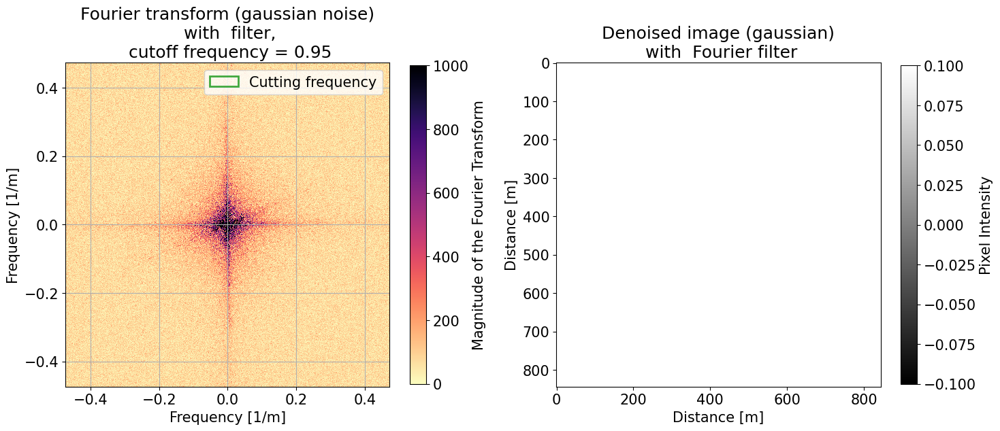

In [36]:
pix_res = 844/800 # determined from Swissmap (map.geo.admin.ch)

# Performing the Fourier transform
dim_x_fft = img.shape[1]
dim_y_fft = img.shape[0]

new_x_fft = np.arange(-np.floor(dim_x_fft/2.), np.floor(dim_x_fft/2.)) / pix_res / dim_x_fft
new_y_fft = np.arange(-np.floor(dim_y_fft/2.), np.floor(dim_y_fft/2.)) / pix_res / dim_y_fft

img_noisy_fft = np.fft.fft2(img_noisy_dict[NOISE_TYPE])
img_noisy_denoised, img_noisy_filt_fft = fft_filter(img_noisy_fft, FILTER_TYPE,CUTTING_FREQUENCY, pix_res)

# Shifting the zero-frequency component to the center of the spectrum
img_noisy_fft_centered = np.fft.fftshift(img_noisy_filt_fft)

# The absolute value of the array
img_noisy_fft_centered_magnitude = np.absolute(img_noisy_fft_centered)
img_noisy_denoised_magnitude = np.absolute(img_noisy_denoised)

# 
fig, axes = plt.subplots(1,2,figsize=(15,8))
ax1 = axes[0]
ax1.set_aspect('equal')
ax1.invert_yaxis()
mappable = ax1.pcolormesh(new_x_fft, new_y_fft,
                          img_noisy_fft_centered_magnitude, 
                          cmap='magma_r', vmin=0., vmax=1000, shading='auto')
plt.sca(ax1)
plt.colorbar(mappable=mappable, label='Magnitude of the Fourier Transform',shrink=0.62)
ax1.set_xlabel('Frequency [1/m]')
ax1.set_ylabel('Frequency [1/m]')
ax1.set_title('Fourier transform (%s noise)\n with %s filter,\n cutoff frequency = %2g'%(NOISE_TYPE, FILTER_TYPE, CUTTING_FREQUENCY))

# Adding a circle highlighting the filter
circle = Circle((0, 0), radius=CUTTING_FREQUENCY, 
                facecolor='none', edgecolor='tab:green', 
                linewidth=2, alpha=0.9, label='Cutting frequency')
ax1.add_patch(circle)
# Labels and legend
ax1.legend()
ax1.set_xlim(new_x_fft.min(),new_x_fft.max())
ax1.set_ylim(new_y_fft.min(),new_y_fft.max())
ax1.grid()


ax2 = axes[1]
ax2.set_aspect('equal')
ax2.invert_yaxis()
mappable2 = ax2.pcolormesh(new_x,new_y,
                           img_noisy_denoised_magnitude, cmap='gray', shading='auto')
plt.sca(ax2)
plt.colorbar(mappable=mappable2, label='Pixel Intensity', shrink=0.62)
ax2.set_xlabel('Distance [m]')
ax2.set_ylabel('Distance [m]')
ax2.set_title('Denoised image (%s)\n with %s Fourier filter'%(NOISE_TYPE,FILTER_TYPE))


plt.tight_layout()
plt.show()

fig.savefig('Figures/epfl_campus_fourier_%s_%s'%(FILTER_TYPE,NOISE_TYPE),dpi=300,bbox_inches='tight')

Now, focus on the Gaussian noise (i.e. set `NOISE_TYPE = 'gaussian'`).

Similar to the investigation you performed for question 7, identify the proper filter type and a good cutoff frequency to perform frequency-based Fourier denoising on our image.

> **Question 18**: What type of filter should be used for denoising purposes, and why? What is an appropriate value of the cutoff frequency? Please justify your answer.


We will now compare the denoising outputs from Fourier and wavelet transforms, using the Gaussian noise image, and the parameters of the Fourier denoising that you defined before (in question 18). \
Before running the following cell, make sure that you ran the previous one using the correct settings (i.e. `NOISE_TYPE = 'gaussian'` and `FILTER_TYPE` and `CUTOFF_FREQUENCY` according to you answer for question 18).

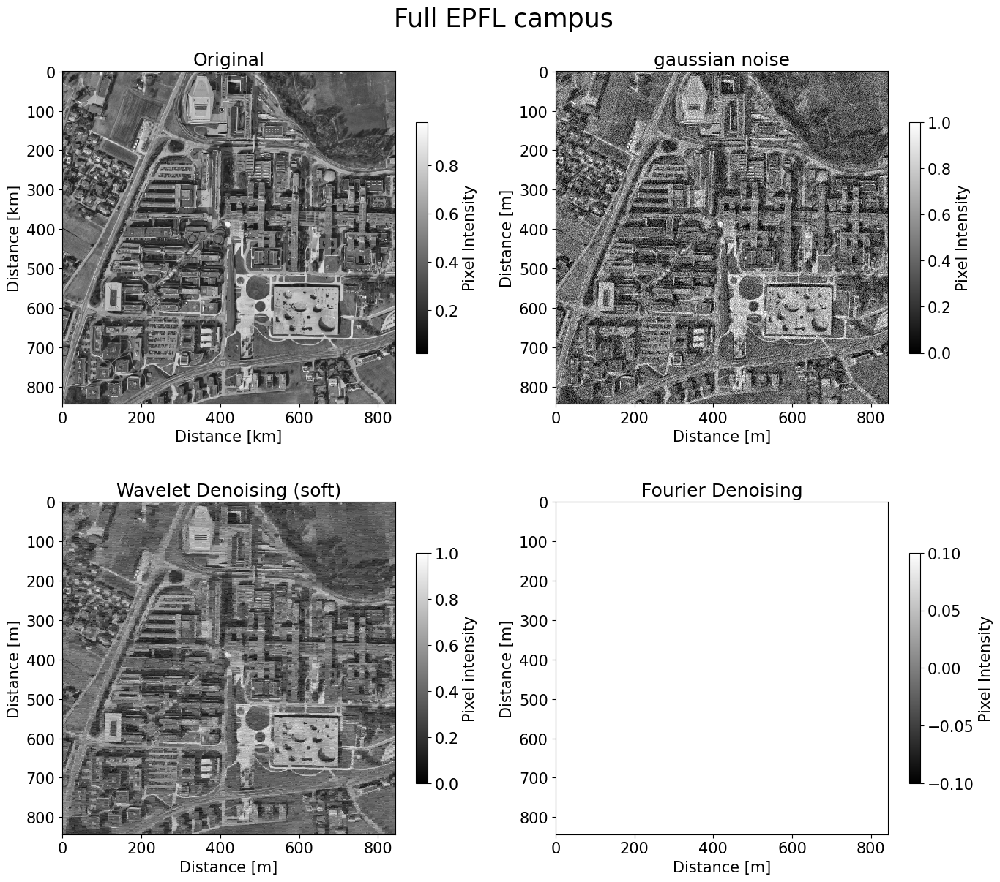

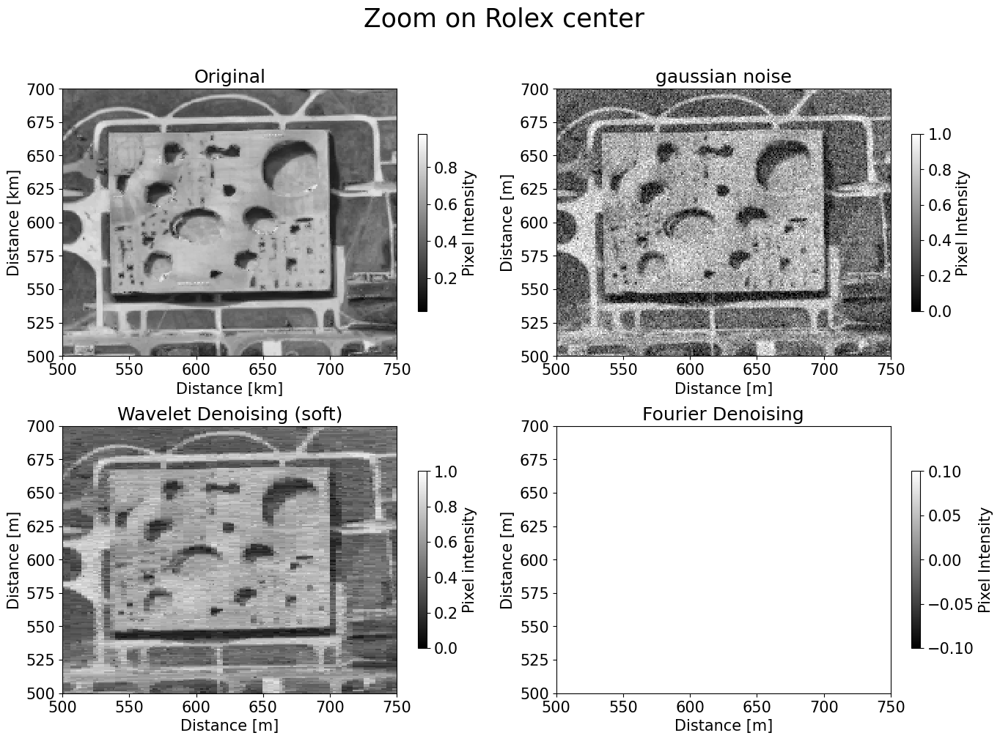

In [37]:
fig, axes = plt.subplots(2,2,figsize=(14,12))


ax0 = axes[0,0]
ax0.set_aspect('equal')
ax0.invert_yaxis()
mappable0 = ax0.pcolormesh(new_x,new_y, img, cmap='gray', shading='auto')
plt.sca(ax0)
plt.colorbar(mappable=mappable0, label='Pixel Intensity', shrink=0.62)
ax0.set_xlabel('Distance [km]')
ax0.set_ylabel('Distance [km]')
ax0.set_title('Original')


ax1 = axes[0,1]
ax1.set_aspect('equal')
ax1.invert_yaxis()
mappable1 = ax1.pcolormesh(new_x,new_y,np.abs(img_noisy_dict[NOISE_TYPE]), cmap='gray', shading='auto')
plt.sca(ax1)
plt.colorbar(mappable=mappable1, label='Pixel Intensity', shrink=0.62)
ax1.set_xlabel('Distance [m]')
ax1.set_ylabel('Distance [m]')
ax1.set_title('%s noise'%NOISE_TYPE)


ax2 = axes[1, 0]
ax2.set_aspect('equal')
mappable = ax2.pcolormesh(new_x, new_y, denoised_soft_img[NOISE_TYPE], cmap='gray', shading='auto', vmin=0., vmax=1.)
plt.sca(ax2)
plt.colorbar(mappable=mappable, label='Pixel intensity',shrink=0.62)
ax2.invert_yaxis()
ax2.set_xlabel('Distance [m]')
ax2.set_ylabel('Distance [m]')
ax2.set_title('Wavelet Denoising (soft)')

ax3 = axes[1,1]
ax3.set_aspect('equal')
ax3.invert_yaxis()
mappable3 = ax3.pcolormesh(new_x,new_y,np.abs(img_noisy_denoised), cmap='gray', shading='auto')
plt.sca(ax3)
plt.colorbar(mappable=mappable3, label='Pixel Intensity', shrink=0.62)
ax3.set_xlabel('Distance [m]')
ax3.set_ylabel('Distance [m]')
ax3.set_title('Fourier Denoising')

plt.tight_layout()
plt.suptitle('Full EPFL campus', y = 1.02,fontsize=25)
plt.show()

fig.savefig('Figures/fourier_vs_wavelet_epfl_campus',dpi=300,bbox_inches='tight')

#######################################################################################################



fig, axes = plt.subplots(2,2,figsize=(14,10))


ax0 = axes[0,0]
ax0.set_aspect('equal')
ax0.invert_yaxis()
mappable0 = ax0.pcolormesh(new_x,new_y,img, cmap='gray', shading='auto')
plt.sca(ax0)
plt.colorbar(mappable=mappable0, label='Pixel Intensity', shrink=0.62)
ax0.set_xlabel('Distance [km]')
ax0.set_ylabel('Distance [km]')
ax0.set_title('Original')


ax1 = axes[0,1]
ax1.set_aspect('equal')
ax1.invert_yaxis()
mappable1 = ax1.pcolormesh(new_x,new_y,np.abs(img_noisy_dict[NOISE_TYPE]), cmap='gray', shading='auto')
plt.sca(ax1)
plt.colorbar(mappable=mappable1, label='Pixel Intensity', shrink=0.62)
ax1.set_xlabel('Distance [m]')
ax1.set_ylabel('Distance [m]')
ax1.set_title('%s noise'%NOISE_TYPE)


ax2 = axes[1, 0]
ax2.set_aspect('equal')
mappable = ax2.pcolormesh(new_x, new_y, denoised_soft_img[NOISE_TYPE], cmap='gray', shading='auto', vmin=0., vmax=1.)
plt.sca(ax2)
plt.colorbar(mappable=mappable, label='Pixel intensity',shrink=0.62)
ax2.invert_yaxis()
ax2.set_xlabel('Distance [m]')
ax2.set_ylabel('Distance [m]')
ax2.set_title('Wavelet Denoising (soft)')

ax3 = axes[1,1]
ax3.set_aspect('equal')
ax3.invert_yaxis()
mappable3 = ax3.pcolormesh(new_x,new_y,np.abs(img_noisy_denoised), cmap='gray', shading='auto')
plt.sca(ax3)
plt.colorbar(mappable=mappable3, label='Pixel Intensity', shrink=0.62)
ax3.set_xlabel('Distance [m]')
ax3.set_ylabel('Distance [m]')
ax3.set_title('Fourier Denoising')

for ax in axes.flatten():
    ax.set_xlim(500,750)
    ax.set_ylim(500,700)
    
plt.suptitle('Zoom on Rolex center', y = 1.01,fontsize=25)
plt.tight_layout()
plt.show()
fig.savefig('Figures/fourier_vs_wavelet_zoom',dpi=300,bbox_inches='tight')

Examine the outputs of both denoising methods, i.e. the **wavelet denoising with soft thresholding**, and the **Fourier frequency filtering**.
> **Question 19**: What differences do you see, on large and small scales? Which method performs best? Based on your understanding of both methods, explain why this is the case. 

> **Question 20**: The Fourier filtering that was implemented here is quite basic. Explain how you could implement a Fourier-based denoising that could deliver better results. Several answers are possible. (There is no need to implement your suggestion.)